In [1]:
from __future__ import absolute_import, division, print_function
#..
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import pyart.graph.cm as pcm
import matplotlib.colors as colors
from matplotlib.colors import LogNorm
from netCDF4 import num2date,date2num,Dataset
import matplotlib._pylab_helpers
#from joblib import Parallel, delayed
import os,subprocess,time,copy
import random
import scipy
import math
import matplotlib.gridspec as gridspec
#import cPickle as pickle
import pickle
import pymc as pm
import arviz as az

#import pymc3
#import pyGPs
#..
import pathlib
import pandas as pd
#import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pytensor
import pytensor.tensor as pt
print(tf.__version__)
print(pm.__version__)
import re
import csv
from io import StringIO
#..
import corner
#..
#import pymc
#import pandas as pd
#print('Running on PyMC3 v{}'.format(pm.__version__))
#import theano
#import theano.tensor as t
%matplotlib inline

# allocating GPU memory

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=10240)]  # in MB
        )
    except RuntimeError as e:
        print(e)

2025-02-26 22:04:03.361539: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-26 22:04:03.376803: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740625443.390839  533342 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740625443.394883  533342 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-26 22:04:03.413811: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

2.18.0
5.20.1


# K1D BOSS single-cat PPE->CPE started Oct 22nd 2024

## Preprocess data

In [50]:
#..First load that data to see what it looks like
base_path = '/home/arthurhu/BOSS_PPE/PPE csv/'
ppe_params_fn = 'condcoll_ppe_sd_ppe_params.csv'
ppe_sim_fn = 'condcoll_ppe_sd_ppe_var.csv'
target_var_fn = 'condcoll_target_var.csv'

In [51]:
param_table = pd.read_csv(base_path + ppe_params_fn)
param_names = param_table.columns[1:].to_list()
param_vals = np.concatenate((param_table.values[:,1:7],param_table.values[:,15:27]), axis=1)
# param_vals = param_table.values[:,1:]
ppe_sim_table = pd.read_csv(base_path + ppe_sim_fn)
ppe_sim_names = ppe_sim_table.columns[1:].to_list()
ppe_sim_vals = ppe_sim_table.values[:,1:]
tgt_sim_table = pd.read_csv(base_path + target_var_fn)
tgt_vals = tgt_sim_table.values[:,3:]
nobs = tgt_vals.shape[1]
print(tgt_vals.shape)
print(ppe_sim_vals.shape)
print(param_vals.shape)

(16, 62)
(2000, 62)
(2000, 18)


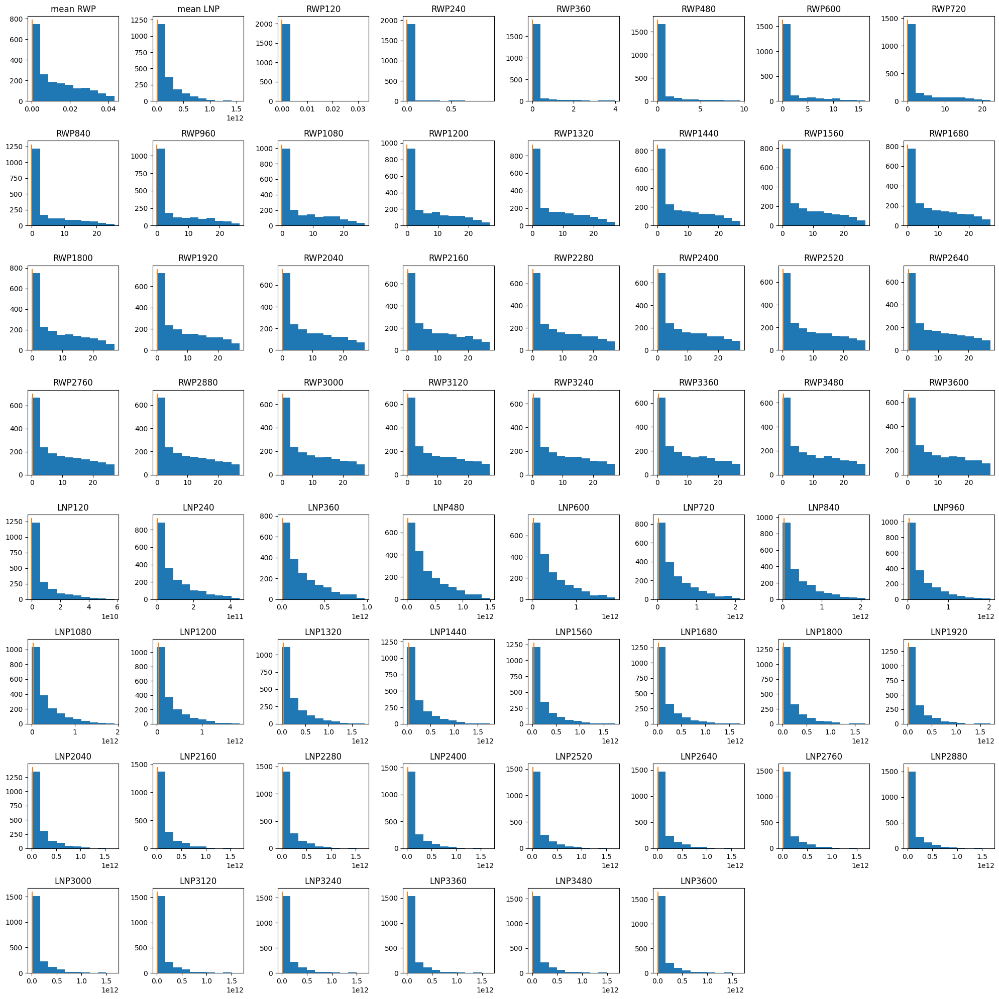

In [52]:
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(8,8)
ii=1
for i in range(nobs):
    ax = fig.add_subplot(gs[i])
    hst = ax.hist(ppe_sim_vals[:2000,i])
    plt.plot((tgt_vals[0,i], tgt_vals[0,i]), ax.get_ylim())
    plt.title(ppe_sim_names[i])

fig.tight_layout()

In [53]:
import sklearn.model_selection as mod_sec
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import preprocessing

In [54]:
#..normalize the parameters (range 0 to 1) and standardize the obs (standard deviation=1, mean=0)
minmaxscale = preprocessing.MinMaxScaler()
param_norm = minmaxscale.fit_transform(param_vals)

#param_norm = param_norm.feature_range
#..
standscale = preprocessing.StandardScaler().fit(ppe_sim_vals)
ppe_sim_stand = standscale.transform(ppe_sim_vals)
print(ppe_sim_stand)

[[ 1.7207205   2.29257475 -0.05290894 ...  1.58536118  1.51045543
   1.43713255]
 [-1.03866511 -0.83732832 -0.05295205 ... -0.56114231 -0.55420262
  -0.54786893]
 [ 1.94048795 -0.2457844  36.14458311 ... -0.4283823  -0.43090233
  -0.4328348 ]
 ...
 [-0.86257576  0.16751909 -0.05295088 ... -0.10398599 -0.12327239
  -0.13646149]
 [-0.65208421 -0.19085133 -0.05295039 ... -0.2629653  -0.27642453
  -0.27512637]
 [-0.56866906 -0.59081925 -0.05295165 ... -0.5575514  -0.55421817
  -0.54995442]]


In [55]:
param_norm.shape

(2000, 18)

In [56]:
ppe_sim_stand.shape

(2000, 62)

In [57]:
print(param_norm.shape)
print(ppe_sim_stand.shape)
npar = param_norm.shape[1]
nobs = ppe_sim_stand.shape[1]
print(npar,nobs)

(2000, 18)
(2000, 62)
18 62


In [58]:
#..split into training and validation (let's forget about test right now)
param_train, param_val, ppe_sim_train, ppe_sim_val = mod_sec.train_test_split(param_norm, ppe_sim_stand, test_size=0.2, random_state=1)
print(param_train.shape, param_val.shape, ppe_sim_train.shape, ppe_sim_val.shape)

(1600, 18) (400, 18) (1600, 62) (400, 62)


In [59]:
type(param_train)

numpy.ndarray

## Start training NNs

In [60]:
# Display training progress by printing a single dot for each completed epoch
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('.', end='')

In [61]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mean_absolute_error'],
           label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_absolute_error'],
           label = 'Val Error')
    plt.plot(hist['epoch'],0.1+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.2+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.3+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.4+0.*hist['epoch'],'k:')
    #plt.ylim([0,1])
    plt.legend()

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mean_squared_error'],
           label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_squared_error'],
           label = 'Val Error')
    plt.plot(hist['epoch'],0.1+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.2+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.3+0.*hist['epoch'],'k:')
    plt.plot(hist['epoch'],0.4+0.*hist['epoch'],'k:')
    #plt.ylim([0,1])
    plt.legend()
    plt.show()

In [62]:
print(npar)

18


In [63]:
#..Build da model ... standard setup
def build_model_00():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    optimizer = tf.keras.optimizers.RMSprop(0.001)

    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

In [64]:
print(param_train.shape, ppe_sim_train.shape)

(1600, 18) (1600, 62)



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

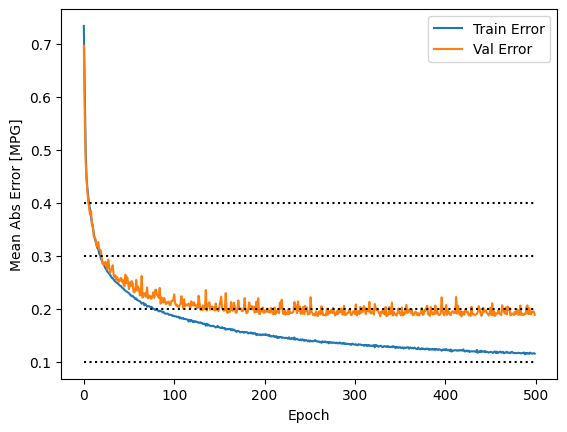

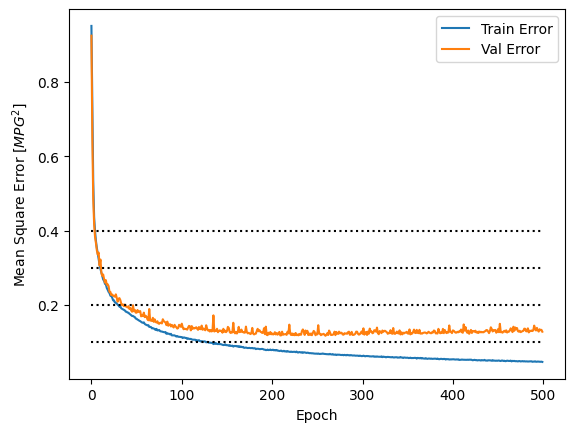

In [65]:
model_00 = build_model_00()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_00.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [66]:
#..Build da model ... deep neural network 01  (looks about the same)
def build_model_01():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.00005)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

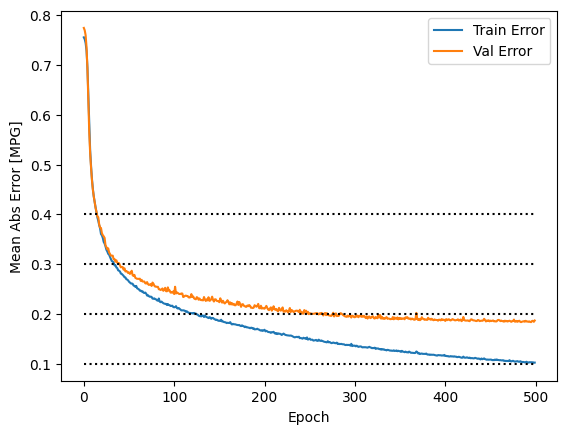

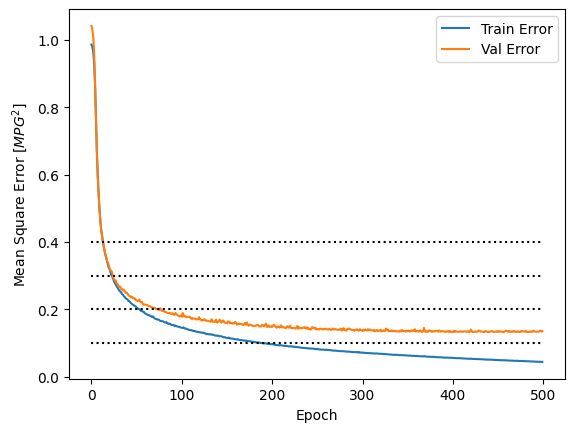

In [67]:
model_01 = build_model_01()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_01.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [68]:
#..Build da model ... deep neural network 02  (looks a bit better)
def build_model_02():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.0001)


    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model

In [69]:
model_02 = build_model_02()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_02.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

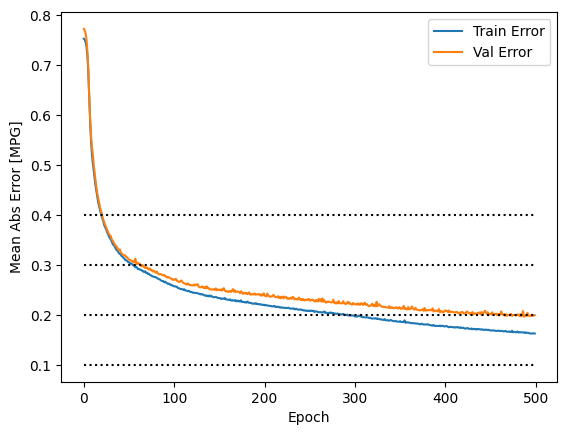

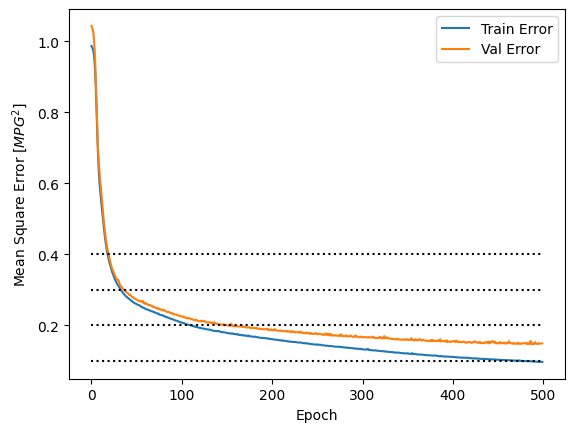

In [70]:
plot_history(history)

In [71]:
#..Build da model ... deep neural network 03 (not any better than 1)
def build_model_03():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(64, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=.0001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  optimizer=optimizer,
                  #optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

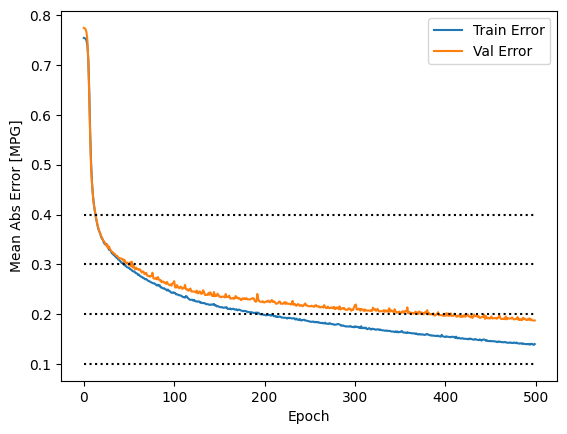

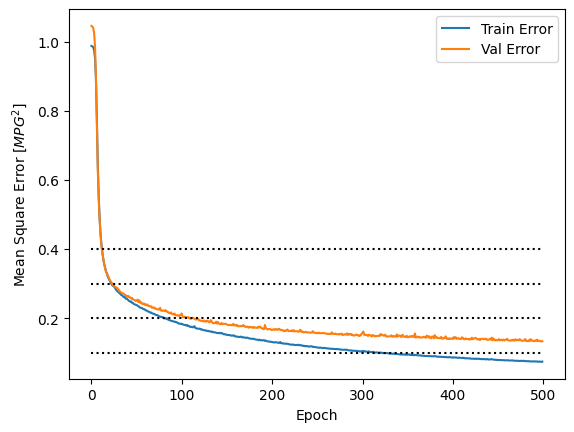

In [72]:
model_03 = build_model_03()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_03.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [73]:
#..Build da model ... deep neural network 04  
def build_model_04():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

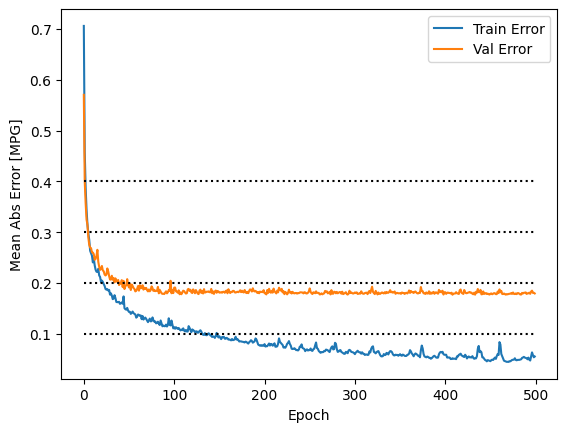

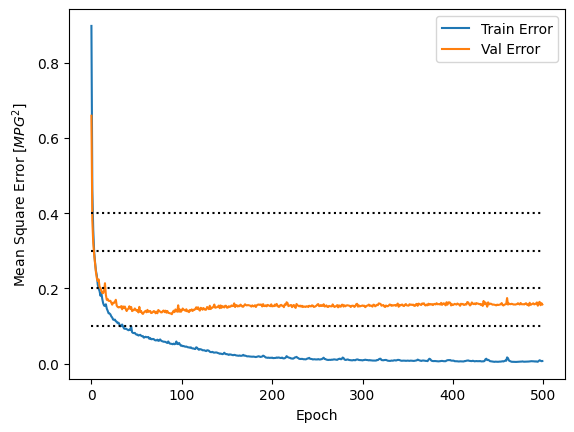

In [74]:
model_04 = build_model_04()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_04.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [75]:
#..Build da model ... deep neural network 05  
def build_model_05():
    def lrelu_01(x): return tf.nn.leaky_relu(x, alpha=0.01)
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

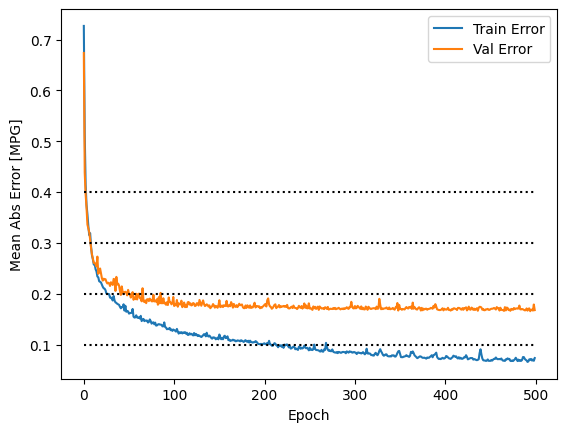

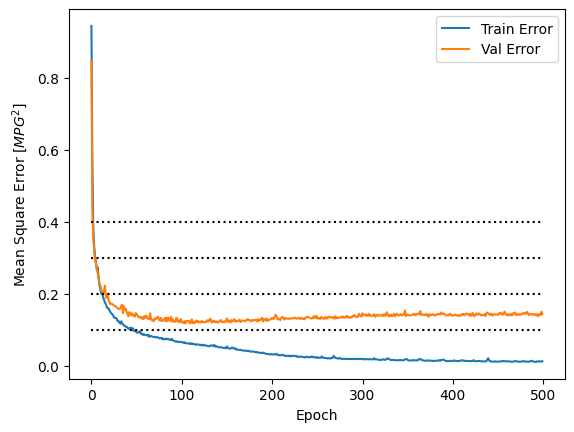

In [76]:
model_05 = build_model_05()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_05.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [77]:
#..Build da model ... deep neural network 06 
def build_model_06():
    def lrelu_01(x): return tf.nn.leaky_relu(x, alpha=0.01)
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(64, kernel_initializer='normal',activation=lrelu_01),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

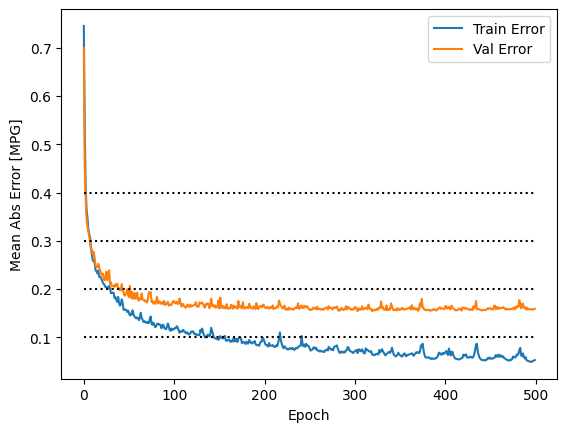

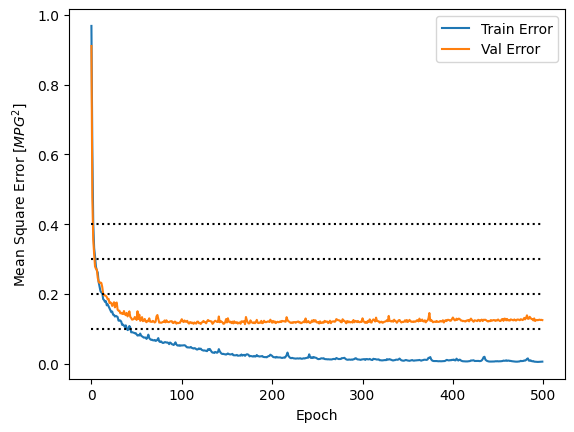

In [78]:
model_06 = build_model_06()
EPOCHS = 500        
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_06.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [79]:
#..Build da model ... deep neural network 07
def build_model_07():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


...

.................................................................................................
....................................................................................................

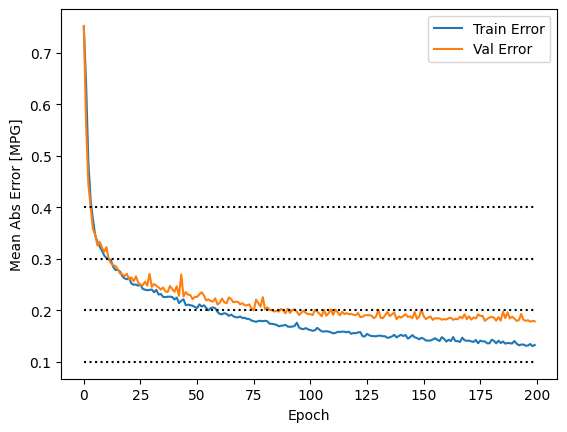

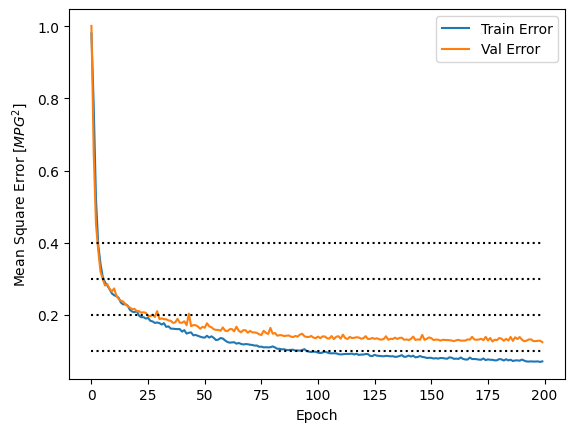

In [80]:
model_07 = build_model_07()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_07.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [81]:
#..Build da model ... deep neural network 08
def build_model_08():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


....................................................................................................
....................................................................................................

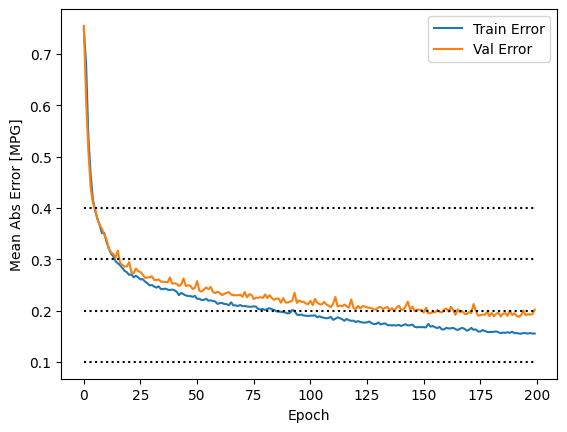

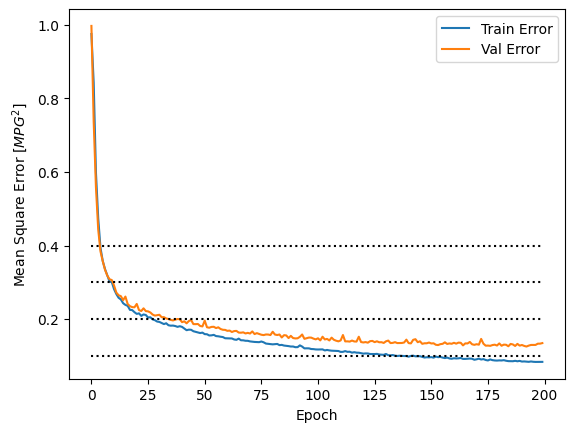

In [82]:
model_08 = build_model_08()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_08.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [83]:
#..Build da model ... deep neural network 09
def build_model_09():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(40, activation=tf.nn.relu),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


.................................................................................................

...
....................................................................................................

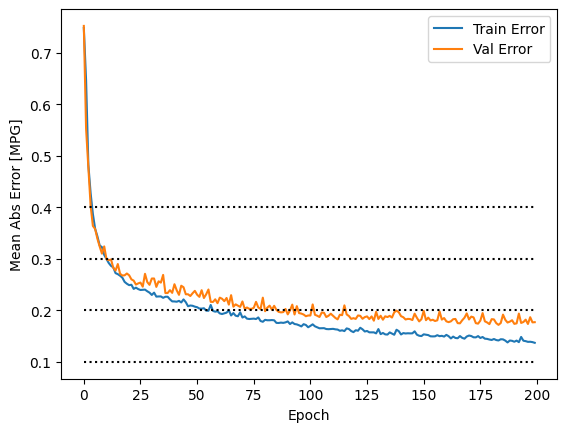

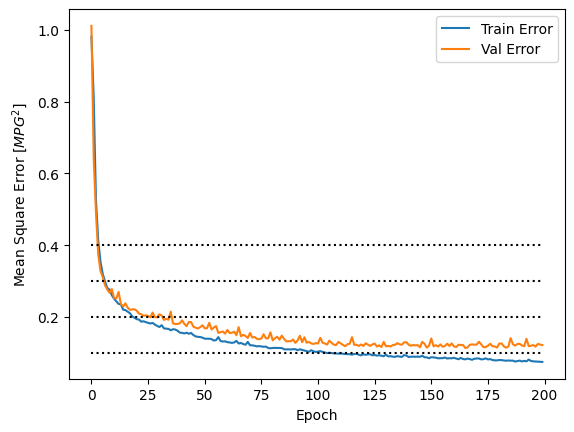

In [84]:
model_09 = build_model_09()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_09.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [85]:
#..Build da model ... deep neural network 09
def build_model_10():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


.................................................

...................................................
....................................................................................................

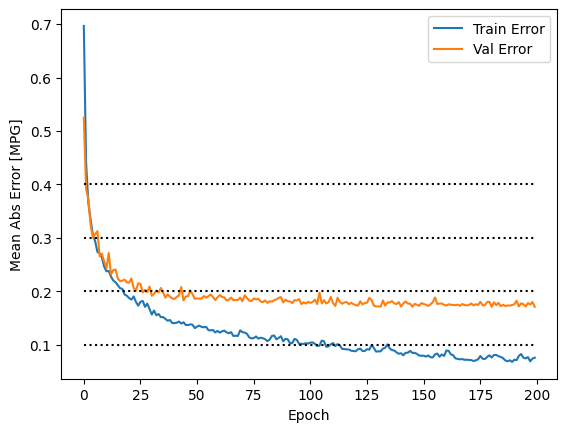

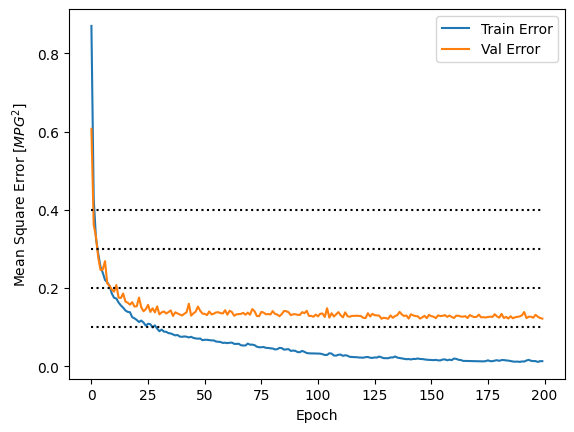

In [86]:
model_10 = build_model_10()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_10.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

In [87]:
#..Build da model ... deep neural network 09
def build_model_11():
    model = keras.Sequential([layers.Input(shape=(npar,)),
                              layers.Dense(64, activation=tf.nn.relu),
                              layers.Dense(128, kernel_initializer='normal',activation='relu'),
                              #layers.Dense(40, kernel_initializer='normal',activation='relu'),
                              layers.Dense(256, kernel_initializer='normal',activation='relu'),
                              layers.Dense(512, kernel_initializer='normal',activation='relu'),
                              layers.Dense(nobs) ])
#                              layers.Dense(1) ])

    #optimizer = tf.keras.optimizers.RMSprop(0.001)

    #model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
    #model.summary()
    
    model.compile(loss='mean_squared_error',
                  #optimizer=optimizer,
                  optimizer='adam',
                  metrics=['mean_absolute_error', 'mean_squared_error'])
    return model


...

.................................................................................................
....................................................................................................

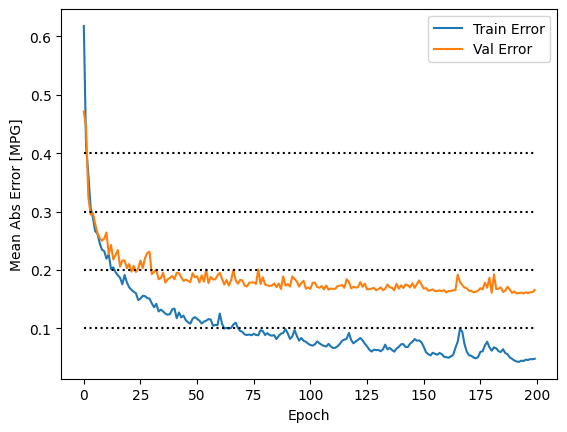

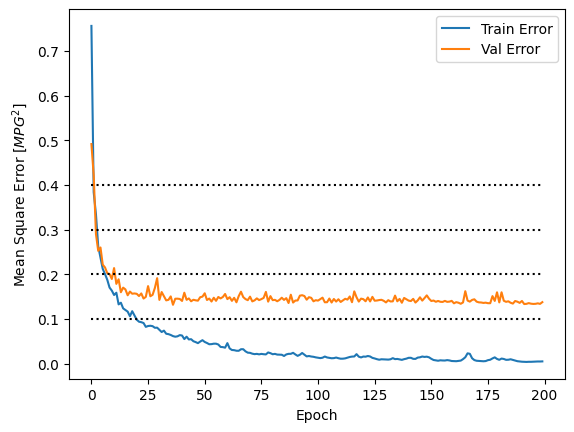

In [88]:
model_11 = build_model_11()
EPOCHS = 200       
#EPOCHS = 5000

#history = model.fit(params_norm.T, obs_stan[0,:], epochs=EPOCHS, validation_split = 0.232558, verbose=0,
#history = model.fit(params_norm.T, obs_stan.T, epochs=EPOCHS, validation_split = 0.2, verbose=0,
history = model_11.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                    validation_data = [param_val,ppe_sim_val], 
                    verbose=0,
                    callbacks=[PrintDot()])
plot_history(history)

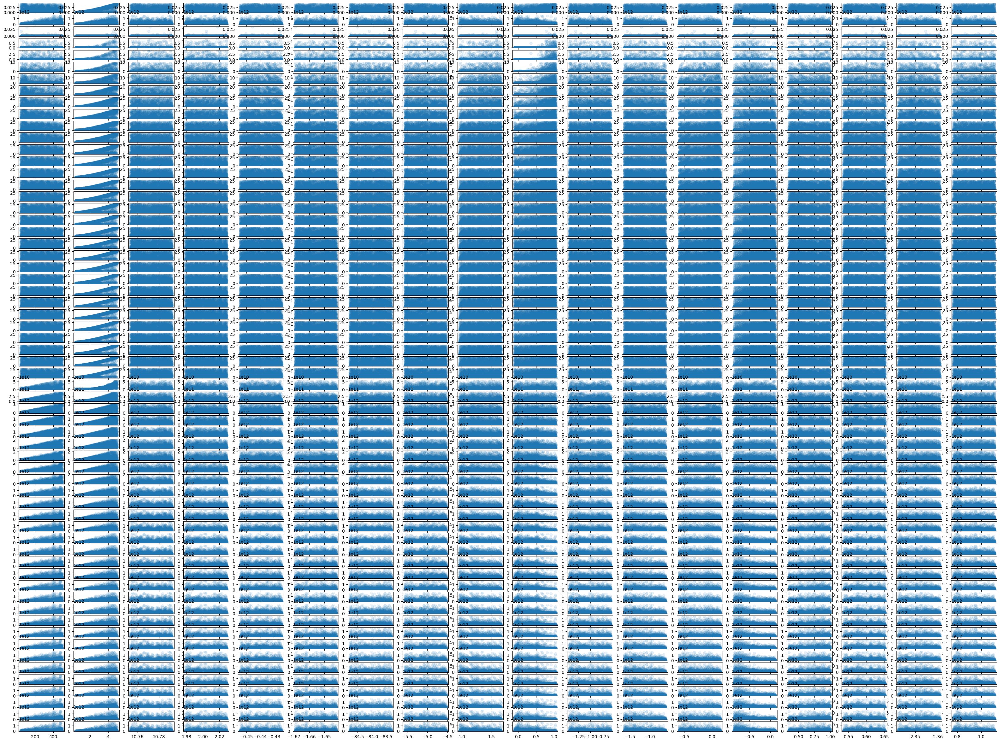

In [89]:
gs = gridspec.GridSpec(nobs,npar)
fig = plt.figure(figsize=(40,30))
for i in range(nobs):
    for j in range(npar):
        ax = fig.add_subplot(gs[i,j])
        ax.scatter(param_vals[:,j],ppe_sim_vals[:,i],alpha=.1)
        #ax.scatter(param_val[:,j],ppe_sim_val[:,i],alpha=.1)
        

In [90]:
print(ppe_sim_vals.shape)
print(param_vals.shape)

(2000, 62)
(2000, 18)


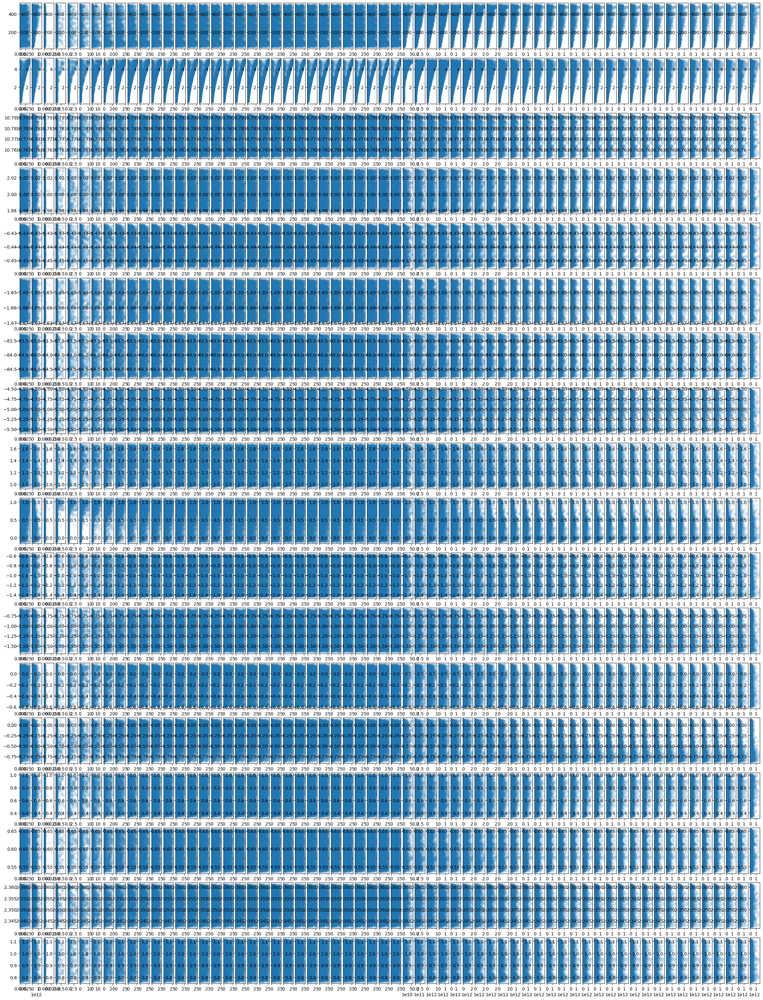

In [91]:
gs = gridspec.GridSpec(npar,nobs)
fig = plt.figure(figsize=(30,40))
for i in range(npar):
    for j in range(nobs):
        ax = fig.add_subplot(gs[i,j])
        ax.scatter(ppe_sim_vals[:,j],param_vals[:,i],alpha=.1)
        #ax.scatter(param_val[:,j],ppe_sim_val[:,i],alpha=.1)

## Put everything together and prep for MCMC

In [92]:
model_01 = build_model_01()
model_02 = build_model_02()
model_03 = build_model_03()
model_04 = build_model_04()
model_05 = build_model_05()
model_06 = build_model_06()
model_07 = build_model_07()
model_08 = build_model_08()
model_09 = build_model_09()
model_10 = build_model_10()


.........

...........................................................................................
.............................................................................................

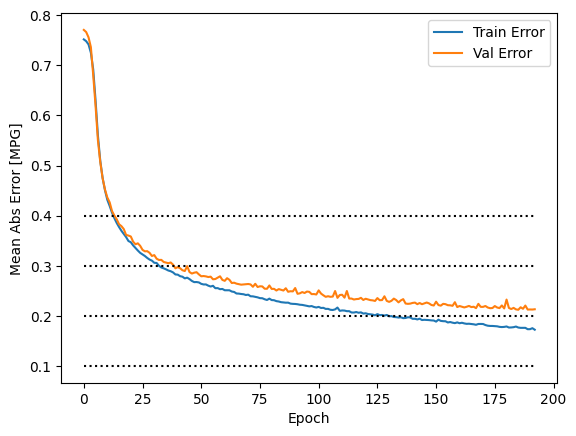

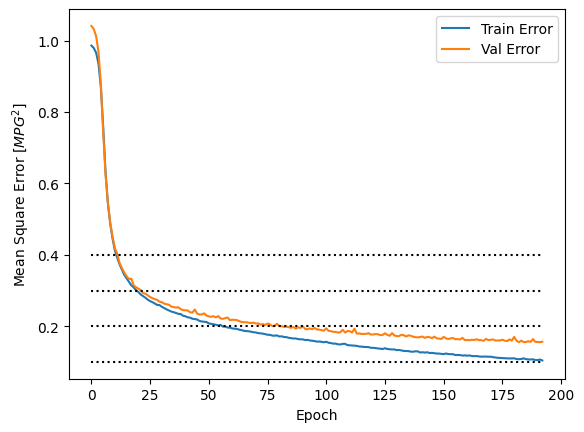


....................................................................................................
....................................................................................................
..............................................

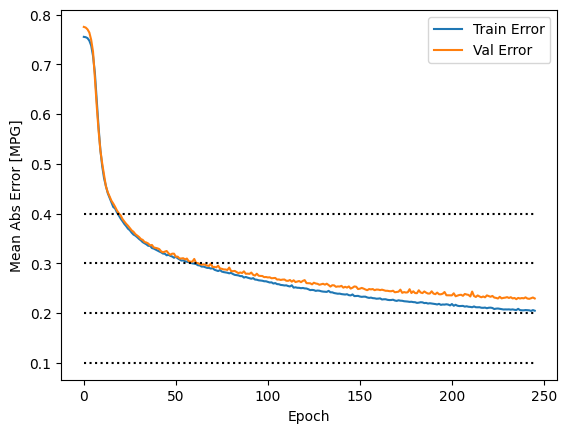

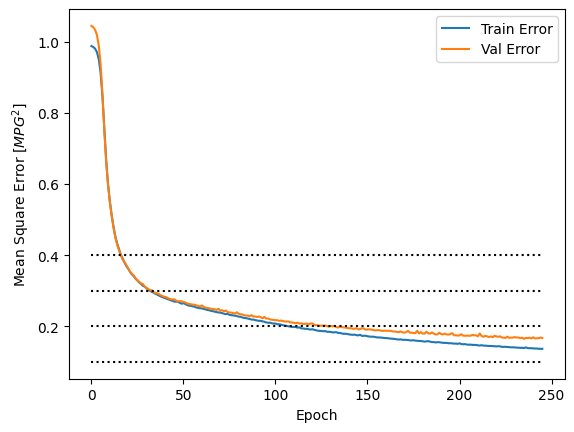


....................................................................................................
....................................................................................................
....................................................................................................
...................

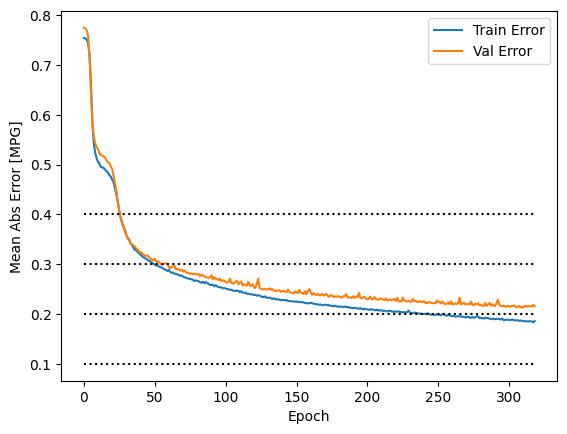

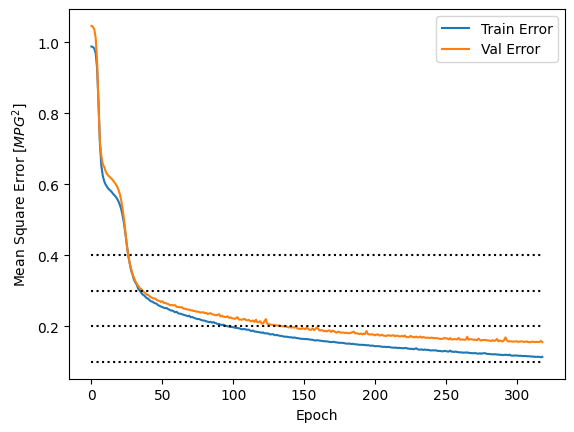


..........................................................................

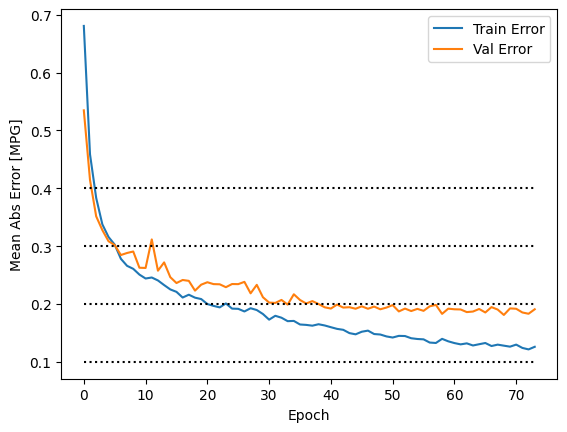

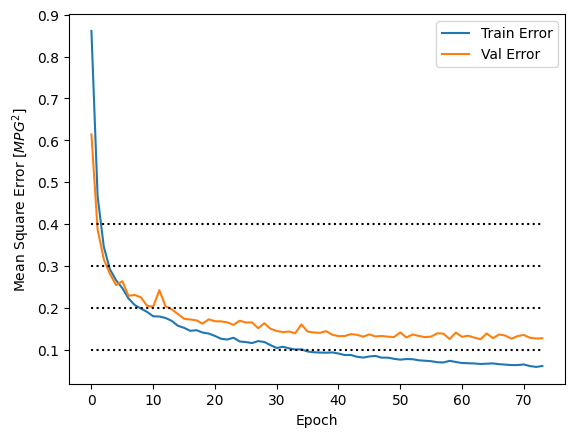


............................................................................................

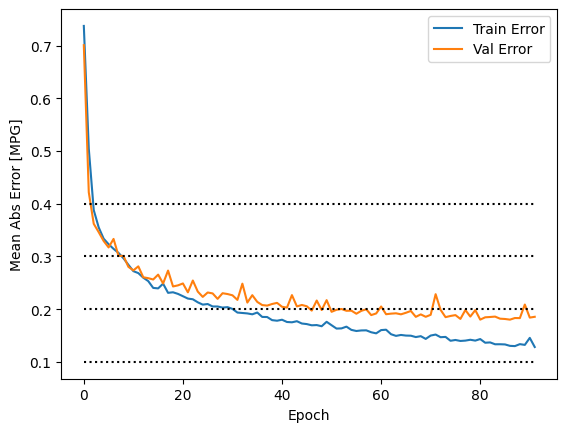

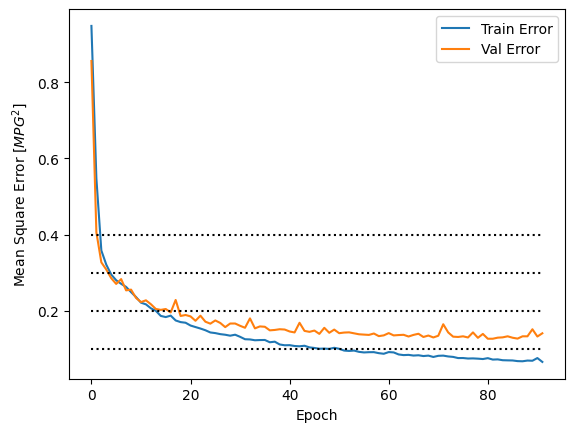


............................................................................

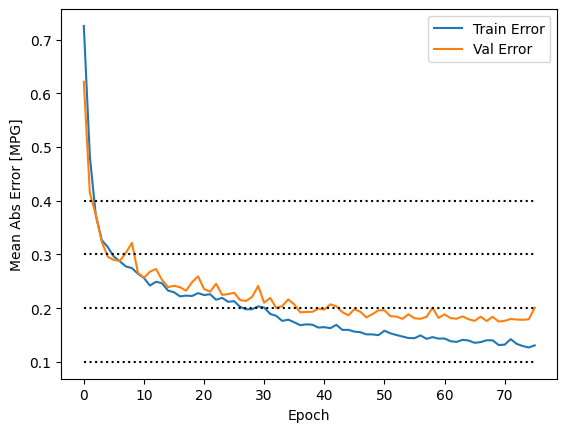

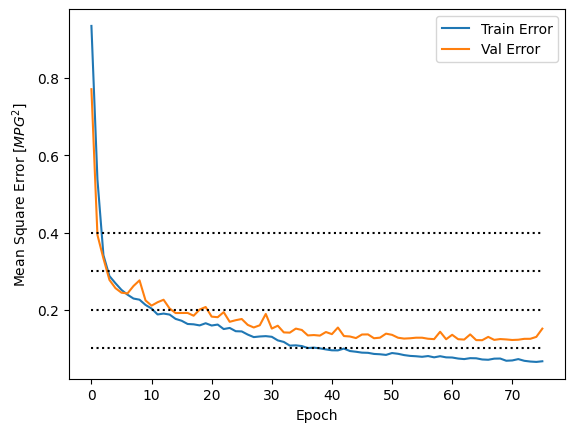


....................................................................................................
..........................

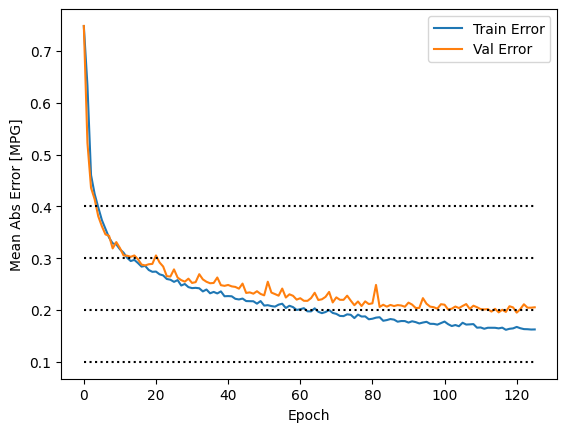

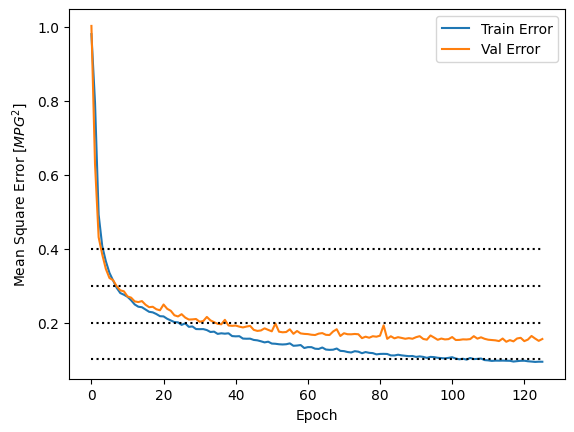


....................................................................................................
.............................................................................................

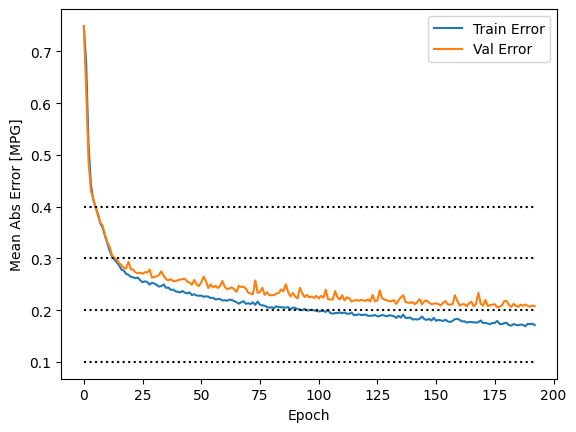

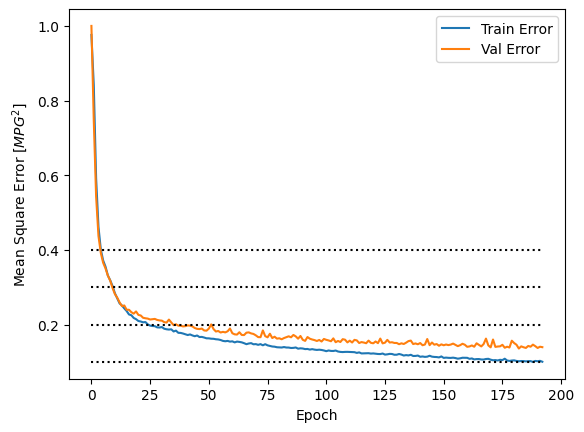


....................................................................................................
.................

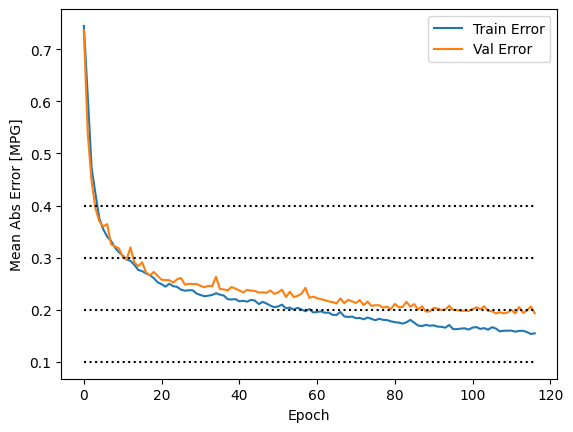

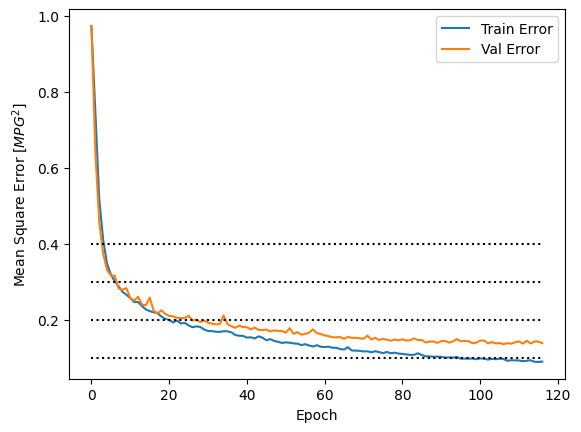


.................................................................

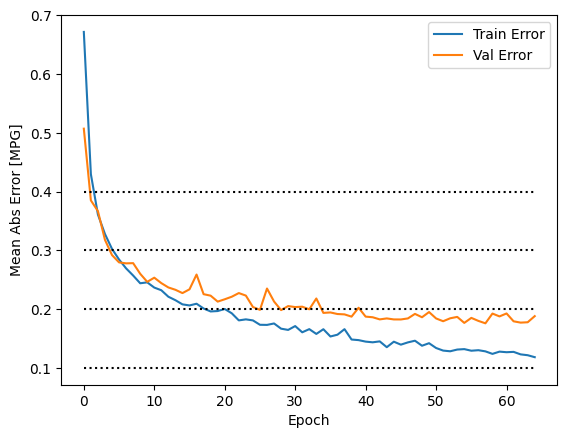

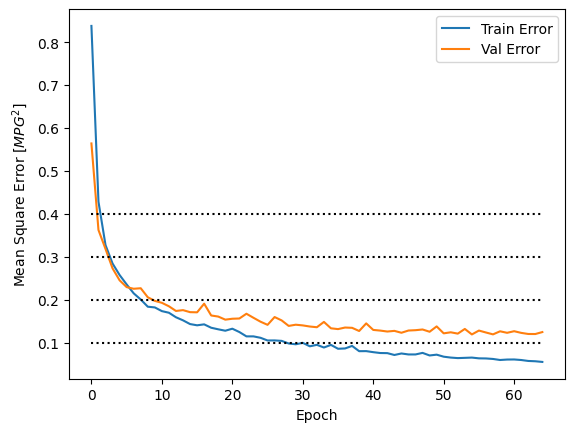

In [93]:
EPOCHS = 1000
modelss = [model_01,model_02,model_03,model_04,model_05,
           model_06,model_07,model_08,model_09,model_10]


# The patience parameter is the amount of epochs to check for improvement
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

for modell in modelss:
    history = modell.fit(param_train, ppe_sim_train, epochs=EPOCHS, 
                         validation_data = [param_val, ppe_sim_val], 
                         verbose=0,
                         callbacks=[early_stop, PrintDot()])
    plot_history(history) 

### average ensemble model

In [94]:
# import Average layer
from tensorflow.keras.layers import Average 

input = tf.keras.Input(shape=[npar], name='input')  # input layer

# get output for each input model
outputs = [model(input) for model in modelss] 

# take average of the outputs
output = Average()(outputs)

# create average ensembled model
avg_model = tf.keras.Model(input, output)

avg_model.save('condcoll_sd.keras')

In [95]:
print(Average()(outputs))
print(npar)

<KerasTensor shape=(None, 62), dtype=float32, sparse=False, name=keras_tensor_393>
18


In [96]:
def lrelu_01(x): return tf.nn.leaky_relu(x, alpha=0.01)
avg_model = tf.keras.models.load_model('condcoll_sd.keras', custom_objects={"lrelu_01": lrelu_01})
test_predictions_av = avg_model(param_val)

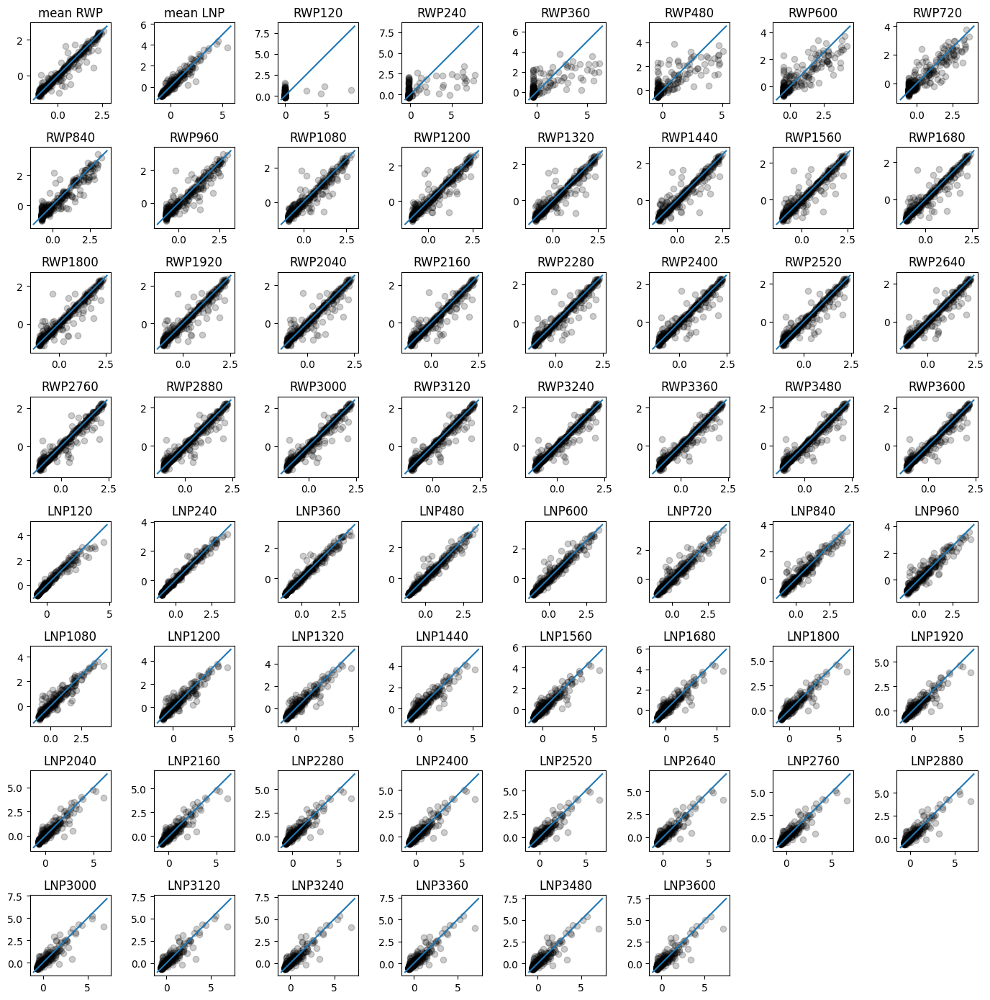

In [97]:
fig = plt.figure(figsize=(14,14))
gs = gridspec.GridSpec(8,8)
ii=1
for i in range(nobs):
    ax = fig.add_subplot(gs[i])
    ax.set_aspect('equal')
    plt.scatter(ppe_sim_val[:,i], test_predictions_av[:,i],alpha=0.2,c='k')
    plt.title(ppe_sim_names[i])
    ax_min = min(list(ax.get_ylim() + ax.get_xlim()))
    ax_max = max(list(ax.get_ylim() + ax.get_xlim()))
    plt.plot([ax_min, ax_max], [ax_min, ax_max])
fig.tight_layout()